# Computer Vision - Assignment 3 - Feature Extraction and Image Stitching

#### 10 points   |   Due date: April 14, 23:59   |   Submission site: https://pradoposgrado2324.ugr.es/

### Student's Full Name: <mark>Mahshad Golafshan</mark>



<font color='blue'>In this assignment you will learn:

<font color='blue'>a) to detect interest points using the Harris Corner Detector (Exercise 2) and a multi-scale approach to detect blobs using the Laplacian of Gaussian (Exercise 1).

<font color='blue'>b) to find correspondences between the keypoints from two images using descriptors (SIFT and Haralick) (Exercise 3).

<font color='blue'>c) to compose a rectangular mosaic/panorama from a bunch of images using homographies (Exercise 4).

In [99]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import sys,os
%cd '/content/drive/My Drive'
get_image = lambda route: os.path.join('/content/drive/MyDrive/images/', route)
import numpy as np
from matplotlib import pyplot as plt
import cv2

Mounted at /content/drive
/content/drive/My Drive


In [100]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [3]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [101]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [102]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

I am starting just with my functions from the assignment 1 , the functions like gaussian, first derivatives of gaussian,  1D discrete masks of the Gaussian, second derivative of Guassian filter, 2D filter and the laplacian of gaussian at the end.

In [103]:
# Here you include your functions from P1 to compute derivatives and convolution

#compute the Guassian filter
def GaussFunc(x,sigma):
    return np.exp(-x**2 / (2 * sigma**2))

#compute the first derivative of Guassian filter
def GaussDeriv1Func(x,sigma):
    return -x / (sigma**2) * GaussFunc(x, sigma)

#compute the second derivative of Guassian filter
def GaussDeriv2Func(x,sigma):
    return 1 / (sigma**2) * (-1+ x**2 / sigma**2) * GaussFunc(x, sigma)

#compute 1D discrete masks of the Gaussian
def gaussianMask1D(sigma=0, sizeMask=0, order=0):
    if sigma == 0 and sizeMask == 0:
        raise ValueError("At least one of sigma or sizeMask must be provided.")

#visualizes the masks for various sigma and mask size values
    if sigma != 0:
        sizeMask=2*int(3*sigma)+1
        x = np.arange(-sizeMask // 2+1, sizeMask // 2 + 1)
        if order == 0:
            mask = GaussFunc(x, sigma)
            mask = mask / np.sum(mask)
        elif order == 1:
            mask = GaussDeriv1Func(x, sigma)
            mask = mask*sigma
        elif order == 2:
            mask = GaussDeriv2Func(x, sigma)
            mask = mask*sigma**2
        else:
            raise ValueError("Invalid order. Must be 0, 1, or 2 for Gaussian, first derivative, or second derivative respectively.")
    else:
        if sizeMask % 2 == 0:
            raise ValueError("SizeMask must be odd.")
        x = np.arange(-sizeMask // 2+1, sizeMask // 2 + 1)
        sigma=(sizeMask-1) / 6
        if order == 0:
            mask = GaussFunc(x, (sizeMask-1) / 6)
            mask = mask / np.sum(mask)
        elif order == 1:
            mask = GaussDeriv1Func(x, (sizeMask-1) / 6)
            mask = mask*sigma
        elif order == 2:
            mask = GaussDeriv2Func(x, (sizeMask-1) / 6)
            mask= mask*sigma**2
        else:
            raise ValueError("Invalid order. Must be 0, 1, or 2 for Gaussian, first derivative, or second derivative respectively.")

    return mask


#2D filter
def my2DConv(im, sigma, orders):
    ddepth = cv2.CV_64F  # Specify the depth of the output image
    maskG = gaussianMask1D(sigma, order=0)  # Gaussian mask
    maskDG = gaussianMask1D(sigma, order=1)  # First derivative of Gaussian mask
    mask2DG = gaussianMask1D(sigma, order=2)  # Second derivative of Gaussian mask

    if orders == [0, 0]:  # Gaussian smoothing
        return cv2.sepFilter2D(im, ddepth, maskG, maskG)
    elif orders == [1, 0]:  # First derivative of Gaussian in X direction
        return cv2.sepFilter2D(im, ddepth, maskDG, maskG)
    elif orders == [0, 1]:  # First derivative of Gaussian in Y direction
        return cv2.sepFilter2D(im, ddepth, maskG, maskDG)
    elif orders == [2, 0]:  # Second derivative of Gaussian in X direction
        return cv2.sepFilter2D(im, ddepth, mask2DG, maskG)
    elif orders == [0, 2]:  # Second derivative of Gaussian in Y direction
        return cv2.sepFilter2D(im, ddepth, maskG, mask2DG)
    else:
        print('error in order of derivative')  # Print error

#laplacian of gaussian
def LoG(im, sigma):
  return my2DConv(im,sigma,[2,0]) + my2DConv(im,sigma,[0,2])


# <font color='blue'>**Exercise 1:** Multi-scale blob detection using the Laplacian of Gaussian (2 points)

<font color='blue'> Students must implement a multiscale blob detector in Python that, based on successive applications of Laplacian of Gaussian (LoG) filters, allows them to identify interest points/regions. The process to follow is detailed below:

> <font color='blue'>1) use the following sigmas to create the corresponding scales: 11 values starting from $\sigma_0 = 0.5$ and increase $\sigma$ by a factor of 1.5. In other words, $\sigma=[0.5, 0.75, 1.125, 1.687, 2.531, 3.796, 5.695, 8.542, 12.814, 19.221, 28.832]$. Remember to convolve the image with scale-normalized LoG.

> <font color='blue'>2) Find maxima of squared Laplacian response in scale-space. Select the local maximum corresponding to a neighborhood $3\times3\times3$, where the central pixel of this volume would be the position to evaluate. That is, each pixel is compared with its 26 neighbors and saved if it is a maximum. The function `maximum_filter` from `scipy.ndimage` may be useful here. Along with this, also use a $\textit{threshold}$ to limit the number of blobs detected to around 1000 points.

> <font color='blue'>3) Draw the detected blobs as circles centered on the identified Cartesian coordinates, and radius proportional to the scale at which the corresponding blob was detected.

<font color='blue'>The process is visually shown on slide 63 of https://pradogrado2324.ugr.es/pluginfile.php/234073/mod_folder/content/0/3.3.BoW_Blobs.pdf

our goal is to detecting blobs in the difference scale, so first we should apply the log on image to become very easy for machine to detect the blob easier because log in the high sigma make the gray image so conviniance by bolding it in the area that we want  in the second step we detect the blobs(maxima of squared Laplacian response in scale-space. Select the local maximum corresponding to a neighborhood  3×3×3).

in second part I want to detect the blobs and show them in the image so apply the maximum filter to find the maximum.

Let's break it down step by step:

1. `from scipy.ndimage import maximum_filter`: This imports the `maximum_filter` function from the `scipy.ndimage` module. This function is used to find local maxima in an array.

2. `from matplotlib.patches import Circle`: This imports the `Circle` class from the `matplotlib.patches` module. This class is used to draw circles on a plot.

3. `fig, ax = plt.subplots()`: This creates a new figure and subplot axes. It returns two objects: `fig`, which represents the whole figure, and `ax`, which represents the subplot axes.

4. `ax.imshow(im, cmap='gray')`: This displays the input image `im` on the subplot axes `ax` using a grayscale colormap.

5. `threshold = 100`: This sets the threshold value, which determines how many strongest corners will be detected.

6. `crafted_im_vec = []`: This initializes an empty list to store crafted images.

7. `for i in range(1, len(filters)-1):`: This iterates over the range of `i` from 1 to `len(filters)-1`. It appears that `filters` is a list of filter responses obtained from some filtering operation performed on the input image.

8. `crafted_im_vec.append(np.array([filters[i-1], filters[i], filters[i+1]]))`: This constructs a crafted image by stacking three adjacent filter responses together. These responses are stored in a numpy array and appended to the `crafted_im_vec` list.

9. `for crafted_im, sigma in zip(crafted_im_vec, sigmas[1:-1]):`: This iterates over the crafted images and their corresponding sigmas.

10. `crafted_im = (crafted_im*2-1)**2`: This applies a transformation to the crafted image by squaring the values after scaling them.

11. `mask = np.array(crafted_im == maximum_filter(crafted_im, size=3))[1]`: This creates a mask by comparing the crafted image with its maximum filtered version. The size of the filter used for maximum filtering is 3x3.

12. `max_indices = np.nonzero(mask)`: This finds the indices of the nonzero elements in the mask.

13. `top_maxima_indices = np.argsort(crafted_im[1][mask])[-threshold:]`: This sorts the values of the crafted image at the locations where the mask is true (i.e., where a local maximum is detected) and selects the indices corresponding to the top `threshold` values.

14. `max_pixel_location_array = (max_indices[0][top_maxima_indices], max_indices[1][top_maxima_indices])`: This retrieves the pixel locations of the top `threshold` maxima.

15. `for i in range(len(max_pixel_location_array[0])):`: This iterates over the pixel locations of the top maxima.

16. `ax.add_patch(Circle((max_pixel_location_array[1][i], max_pixel_location_array[0][i]), sigma*np.sqrt(2), color='r', fill=False))`: This adds a red circle to the plot at each detected corner location. The circle is centered at `(max_pixel_location_array[1][i], max_pixel_location_array[0][i])` with a radius of `sigma*np.sqrt(2)`.



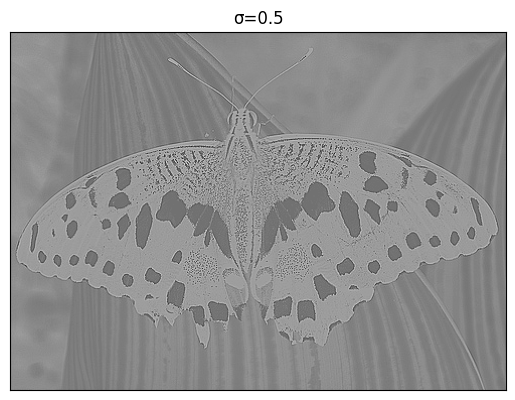

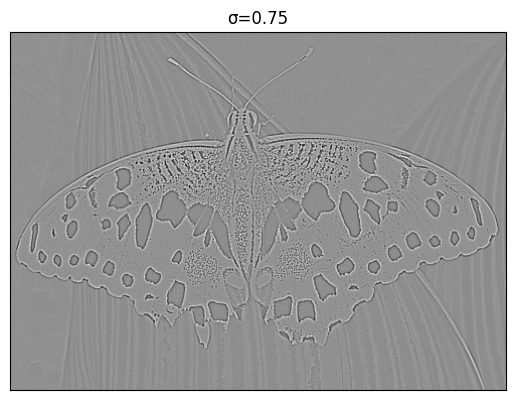

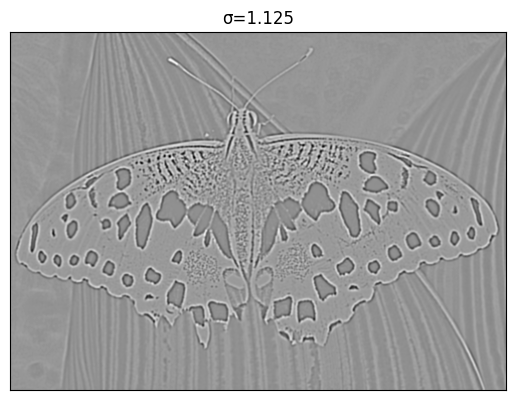

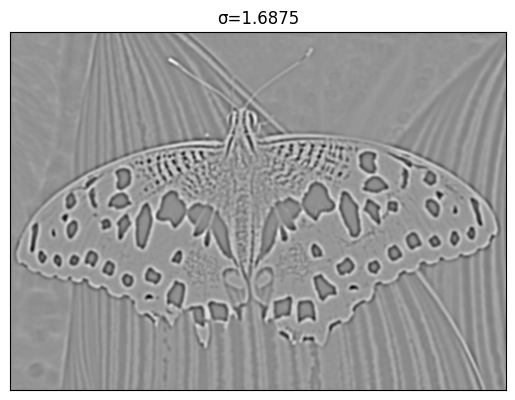

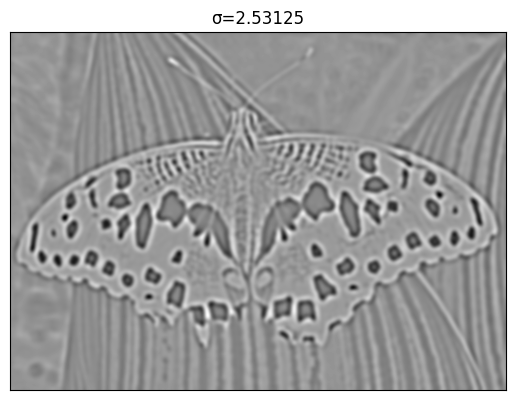

...

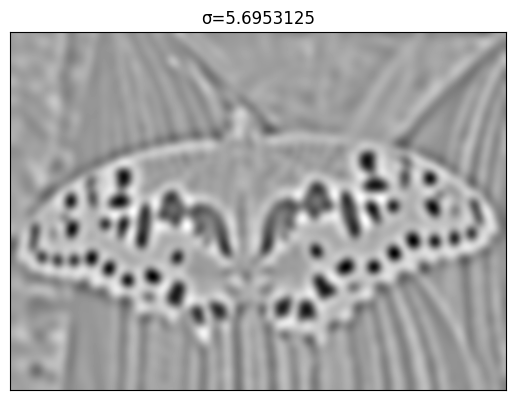

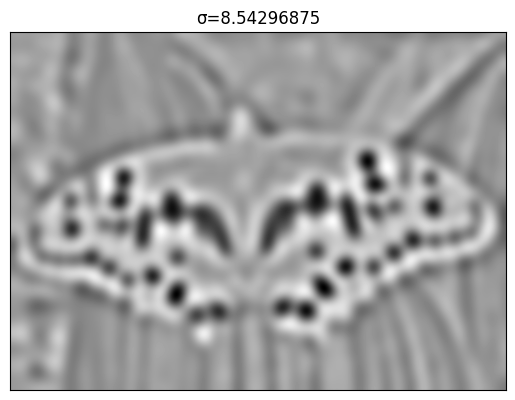

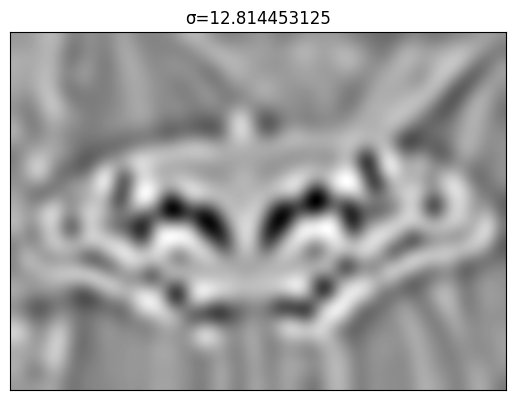

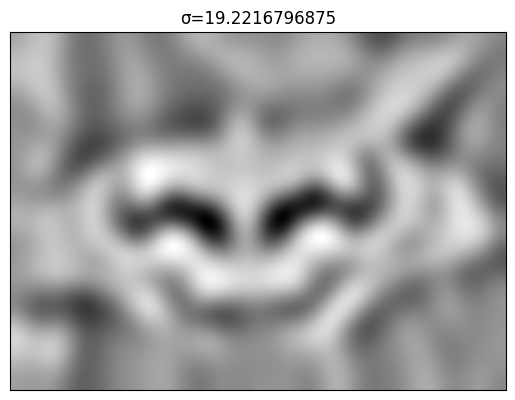

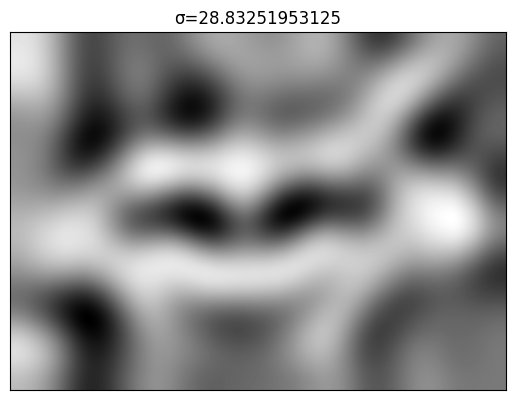

In [104]:
im = readIm(get_image('/content/drive/MyDrive/Images/images/butterfly.jpg'),0)
sigmas = [0.5 * (1.5 ** i) for i in range(11)]
# filter the image with laplacian of gaussain for different scales
filters= []
for sigma in sigmas:
    log_im = rangeDisplay01(LoG(im, sigma))
    displayIm(log_im, title=f'σ={sigma}', factor=1)
    filters.append(log_im)

mask 0.75 : 1339 (100,)
mask 1.125 : 4504 (100,)
mask 1.6875 : 469 (100,)
mask 2.53125 : 209 (100,)
mask 3.796875 : 498 (100,)
mask 5.6953125 : 211 (100,)
mask 8.54296875 : 91 (91,)
mask 12.814453125 : 43 (43,)
mask 19.2216796875 : 25 (25,)


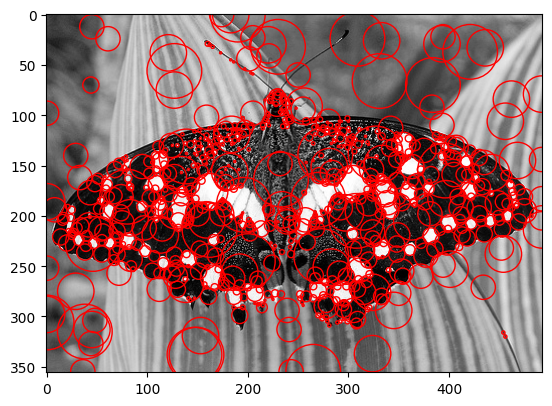

In [105]:
from scipy.ndimage import maximum_filter
from matplotlib.patches import Circle

fig,ax = plt.subplots()
ax.imshow(im, cmap='gray')
threshold = 100
crafted_im_vec = []
for i in range(1,len(filters)-1):
  crafted_im_vec.append(np.array([filters[i-1],filters[i],filters[i+1]]))
for crafted_im, sigma in zip(crafted_im_vec, sigmas[1:-1]):
    crafted_im = (crafted_im*2-1)**2
    mask = np.array(crafted_im == maximum_filter(crafted_im, size=3))[1]

    max_indices = np.nonzero(mask)
    top_maxima_indices = np.argsort(crafted_im[1][mask])[-threshold:]
    # Get the coordinates of the top maxima
    max_pixel_location_array = (max_indices[0][top_maxima_indices], max_indices[1][top_maxima_indices])
    print('mask', sigma, ':', np.sum(mask==1), max_pixel_location_array[0].shape)

    for i in range(len(max_pixel_location_array[0])):
        ax.add_patch(Circle((max_pixel_location_array[1][i], max_pixel_location_array[0][i]), sigma*np.sqrt(2), color='r', fill=False))
plt.show()


# <font color='blue'>**Exercise 2:** Harris Corner Detector (3 points)

<font color='blue'>Write the Python code necessary to implement the detection of the stronger 100-150 Harris points in an image. The steps to implement the Harris corner detector are the following: \


> <font color='blue'>a) Set the derivative ($\sigma_D$) and integration scales ($\sigma_I$) to 1.5 and 2.25, respectively. Other sigma values can also be employed if the student considers that it improves performance.



> <font color='blue'>b) Compute the image derivatives.

> <font color='blue'>c) Compute the three terms of the second moment matrix ($SMM$) at each pixel. To do it, apply convolution with a Gaussian mask with $\sigma_I$.

> <font color='blue'>d) Compute the Harris value at each pixel of the image.

> <font color='blue'>e) Apply Non-Maxima Suppression by using the function `corner_peaks()` (https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.corner_peaks) from the module `skimage.features`. The student must select a suitable `min_distance` (`minimal allowed distance separating peaks`), and a suitable response threshold in the Harris Map to just keep the number of keypoints we need (100-150). The output will be a list of $(x,y)$ coordinates. Extract the values in these coordinates and create a list of vectors $(x,y,value)$.

> <font color='blue'>f) Compute the main orientation for each point. This is done by smoothing both derivative images with a sufficiently large sigma ($\sigma=3$) and computing the orientation of the gradient at those points.

> <font color='blue'>d) Create a list of KeyPoints using the selected points. A KeyPoint is a vector including $(x,y,scale,orientation)$. A KeyPoint is an OpenCV's structure (`cv2.KeyPoint`), associated to each detected region,  necessary to call OpenCV feature extractor algorithms.

> <font color='blue'>e) Draw the keypoints on the image using the function `drawKeyPoints()` (https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920), and flags `cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.


In [106]:
# Compute image derivatives
def derivatives(im,sigmaD):
  im=im.astype(np.float32)
  dx = my2DConv(im, sigmaD,[1,0])
  dy = my2DConv(im, sigmaD,[0,1])
  return dx,dy

# Compute Harris-criterium Map
def HarrisMap(dx,dy,sigmaI):
  # Compute the three terms of the SMM at each pixel.
    dxy = dx * dy
    dx2 = my2DConv(dx**2, sigmaI, [0,0])
    dy2 = my2DConv(dy**2, sigmaI, [0,0])
    dxdy = my2DConv(dx*dy, sigmaI, [0,0])
    detH = dx2 * dy2 - dxy ** 2
    traceH = dx2 + dy2
    HMap= detH/traceH
    return HMap



In [107]:

#   # Non-Maxima Suppression
# def NonMaximaSuppression(harrisMap, min_distance, threshold):
#     points = corner_peaks(harrisMap, min_distance, threshold_abs=threshold)
#     coord = np.transpose(np.nonzero(points))
#     values = harrisMap[points]

#     # Sorting based on peak values
#     sorted_indices = np.argsort(values)
#     sorted_indices = sorted_indices[-threshold:]  # Select top threshold peaks
#     sorted_coord = coord[sorted_indices]
#     sorted_values = values[sorted_indices]

#     return sorted_coord, sorted_values


# suppress the non-maximum values in harris map
def NonMaximaSuppression(harris_map, min_distance=1, threshold=-1):
  # find peaks
  peaks_mask = corner_peaks(harris_map, min_distance, indices=False)

  # get the indices and sort to get the highest peaks
  peaks_index = np.nonzero(peaks_mask) # get the indices of peaks
  if threshold == -1 or (len(peaks_index[0]) < threshold):
    top_indices = np.argsort(harris_map[peaks_mask])
  else:
    top_indices = np.argsort(harris_map[peaks_mask])[-threshold:] # if number of peaks are high, keep only threshold amount of them

  # get the coordinates and their corresponding value in harris map
  coord = peaks_index[0][top_indices], peaks_index[1][top_indices]
  values = harris_map[coord]
  return coord, values


we hae oriantation function with the math formula of:


the first keypoint function give me the erroe of too much attribiute to unpack i dont know why because these two function do the same thing but the first is just with the ordinary for loop but with the function that I am not commented it workes so I just comment the first function and I appritiate that if you tell why it is happening.

In [108]:
# compute the orientation map
def orientation(dx,dy,smoothing_sigma=3):
  # Let's compute  orientation in degrees
  theta = np.arctan2(dy, dx) * 180 / np.pi
  return theta


# Create the KeyPoint list from the lists of locations, orientations and scales

# def keyPoints(coord,theta,size):
#     keyPoints=[]
#     for i in range(len(coord)):
#         x, y = coord[i]
#         angle = theta[y, x]
#         keyPoint = cv2.KeyPoint(x, y, size, angle)
#         keyPoints.append(keyPoint)
#     return(keyPoints)

def keyPoints(coord,theta,size):
  keypoints = [cv2.KeyPoint(float(x), float(y), size, theta[y,x]) for y,x in np.transpose(coord)]
  return keypoints

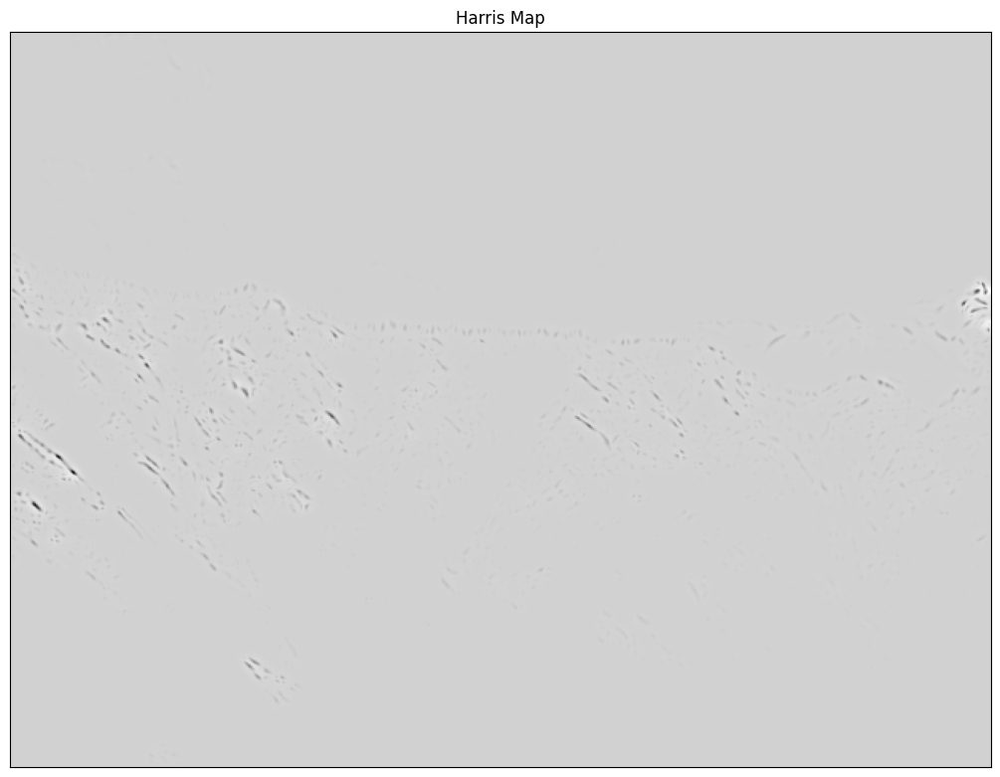

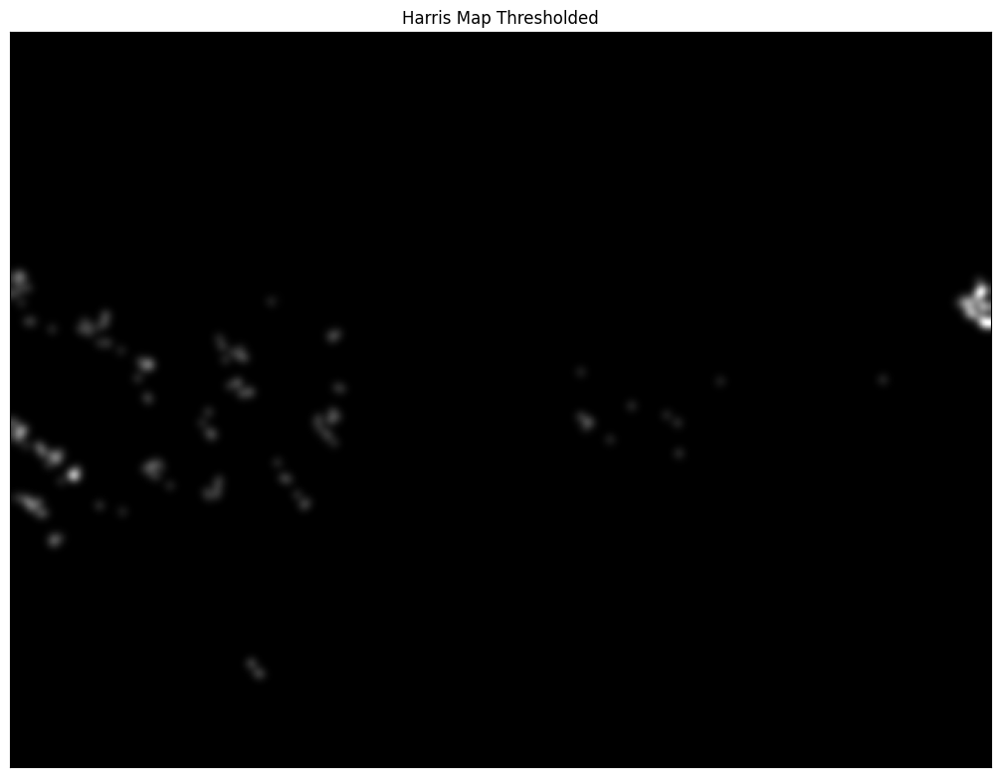

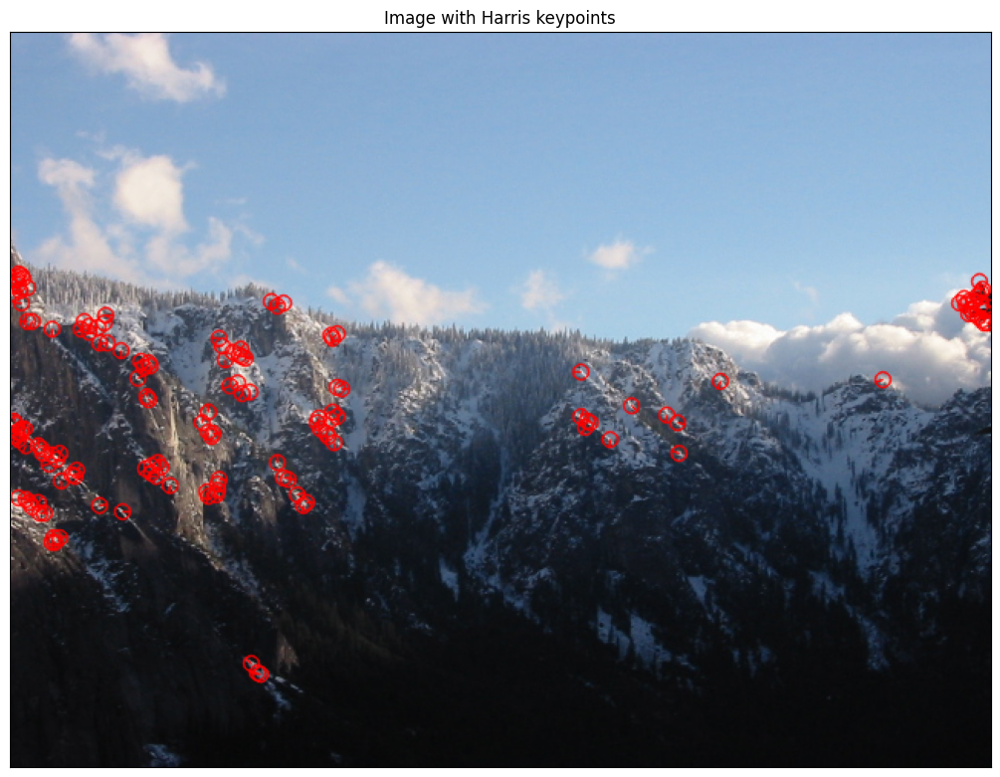

In [109]:
# Let's compute the KeyPoints-Harris and display them

from skimage.feature import corner_peaks



# Load image and compute derivatives
img = readIm(get_image('/content/drive/MyDrive/Images/images/yosemite7.jpg'), 1)
sigmaD = 1.5
# dx, dy = derivatives(img, sigmaD)

# Compute Harris Map
sigmaI = 2.25
img_bw=readIm(get_image('/content/drive/MyDrive/Images/images/yosemite7.jpg'),0)
dx, dy = derivatives(img_bw, sigmaD)
harrisMap = HarrisMap(dx, dy, sigmaI)
displayIm(harrisMap, 'Harris Map')


# # apply non maximum suppression and display properly
# sorted_coord, sorted_values = NonMaximaSuppression(HarrisMap, 10,threshold=150)
# suppressed_harris = np.zeros_like(HarrisMap)
# suppressed_harris[sorted_coord] = sorted_values
# for y,x in np.transpose(sorted_coord):
#     suppressed_harris[x-3:x+3, y-3:y+3] = 1
# suppressed_harris_blurred = my2DConv(suppressed_harris, 3, [0,0])
# displayIm(suppressed_harris_blurred, 'Harris Map Thresholded')

#apply non maximum suppression and display properly
coord, values = NonMaximaSuppression(harrisMap, threshold=150)
suppressed_harris = np.zeros_like(harrisMap)
suppressed_harris[coord] = values
for y,x in np.transpose(coord):
    suppressed_harris[x-3:x+3, y-3:y+3] = 1
suppressed_harris_blurred = my2DConv(suppressed_harris, 3, [0,0])
displayIm(suppressed_harris_blurred, 'Harris Map Thresholded')


# Compute orientation map
theta = orientation(dx, dy)

# Create KeyPoints
size = 10
keyPointsList = keyPoints(coord, theta, size)

# Draw keypoints on the image
img_with_keypoints = cv2.drawKeypoints(img,keyPointsList, np.array([]), (255, 0, 0), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the image with keypoints
displayIm(img_with_keypoints,'Image with Harris keypoints')
# cv2.waitKey(0)
# cv2.destroyAllWindows()


# <font color='blue'>**Exercise 3:** Matching keypoints between images using SIFT and Haralick descriptors (2 points)

<font color='blue'>Write the Python code necessary to compute the matching between points from two images. To do so, you have to apply the SIFT algorithm to both images in order to extract keypoints and descriptors (see https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html). Then, we use the Brute-Force cross-check criterion (`cv2.BFMatcher`) and Lowe's ratio distance criterion (`knnMatch`) to compute the matches and draw the best 100 matches using the function `cv2.drawMatches`.

It seems there's a mix-up between "Haralick" and "SIFT" descriptors. Let's clarify the differences between them:

1. **Haralick Descriptor**:
   - The Haralick descriptor is derived from the gray-level co-occurrence matrix (GLCM), which captures the spatial relationship between pixel intensities in an image.
   - It characterizes the texture of an image based on statistical measures such as contrast, correlation, energy, and homogeneity.
   - Haralick descriptors are commonly used in texture analysis tasks such as image classification and segmentation.

2. **SIFT Descriptor**:
   - SIFT (Scale-Invariant Feature Transform) descriptor is designed to detect and describe local features in an image that are invariant to scale, rotation, and illumination changes.
   - It operates by identifying key points (or interest points) in an image and computing a descriptor vector based on the gradient magnitude and orientation in the local neighborhood around each key point.
   - SIFT descriptors are widely used in various computer vision applications such as object recognition, image stitching, and 3D reconstruction.

While both descriptors serve different purposes, SIFT descriptors are more commonly used for keypoint matching tasks due to their robustness to various transformations and lighting conditions. If you're aiming for keypoint matching between images, SIFT descriptors would likely be more suitable than Haralick descriptors. However, if your task involves texture analysis or classification, Haralick descriptors may be more appropriate.

In [110]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [111]:
# this function computes KeyPoints and descriptors in an image using SIFT
def siftPoints(im, nfeatures=5000):
    sift = cv2.SIFT_create(nfeatures=nfeatures)
    kp, ds = sift.detectAndCompute(im, None)
    return kp, ds


In [112]:
# This function display the KeyPoints of an image
def showKP(im, kp, title='Key Points'):
    img = cv2.drawKeypoints(im, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    displayIm(img,title, 1)

# This function display the matches between two images
def showMatches(im1, kp1, im2, kp2, matches, N, title='Matches'):
  #  imBF = cv2.drawMatches(im1, kp1, im2, kp2, matches[:N], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
   imBF = cv2.drawMatches(im1, kp1, im2, kp2, matches[:N], None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

   displayIm(imBF, title,factor=2)

#This function compute matches between descriptors of two images
def matching(ds1, ds2, FlagMode='BF'):
    if FlagMode == 'BF':
        bf = cv2.BFMatcher()
        matches = bf.match(ds1, ds2)
        matches = sorted(matches, key = lambda x:x.distance) # sorting the matches based on distance between two keypoints
        return matches
    elif FlagMode == 'KNN':
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(ds1, ds2, k=2)
        # Apply Lowe's ratio test
        good = []
        for m, n in matches:
            if m.distance < 0.75 * n.distance:
                good.append(m)
        good = sorted(good, key = lambda x:x.distance) # sorting the matches
        return good
    else:
        return print('Error in Matching mode')


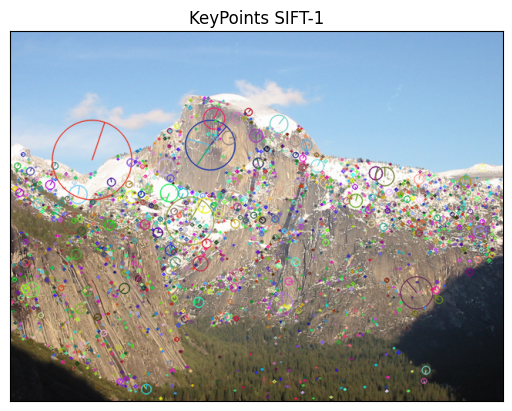

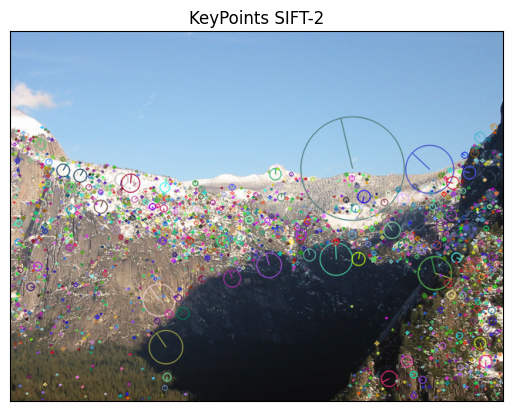

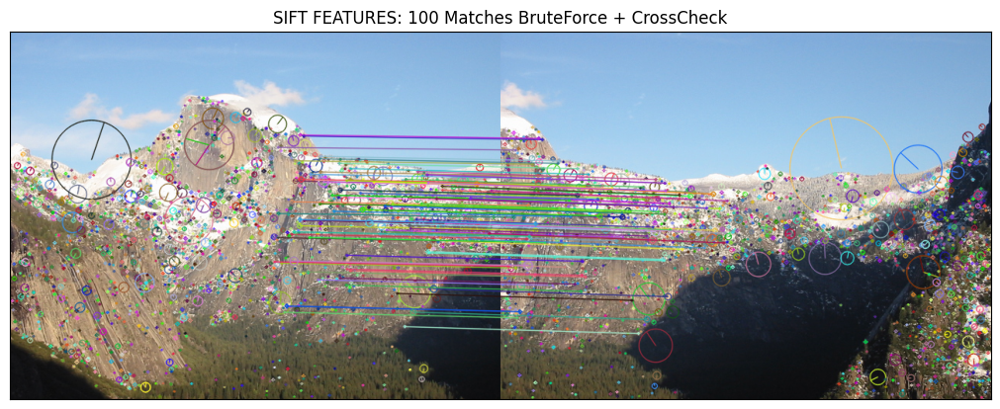

In [113]:
# Read the images
im1 = readIm(get_image('/content/drive/MyDrive/Images/images/yosemite2.jpg'), 1)
# im1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
im2 = readIm(get_image('/content/drive/MyDrive/Images/images/yosemite3.jpg'), 1)
# im2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Compute keypoints and descriptors
kp1, ds1 = siftPoints(im1)
kp2, ds2 = siftPoints(im2)

# Display KeyPoints of the images
showKP(im1, kp1, 'KeyPoints SIFT-1')
showKP(im2, kp2, 'KeyPoints SIFT-2')

# Compute matches
matches = matching(ds1, ds2, FlagMode='BF')

# Show matches
showMatches(im1, kp1, im2, kp2, matches, 100,'SIFT FEATURES: 100 Matches BruteForce + CrossCheck' )





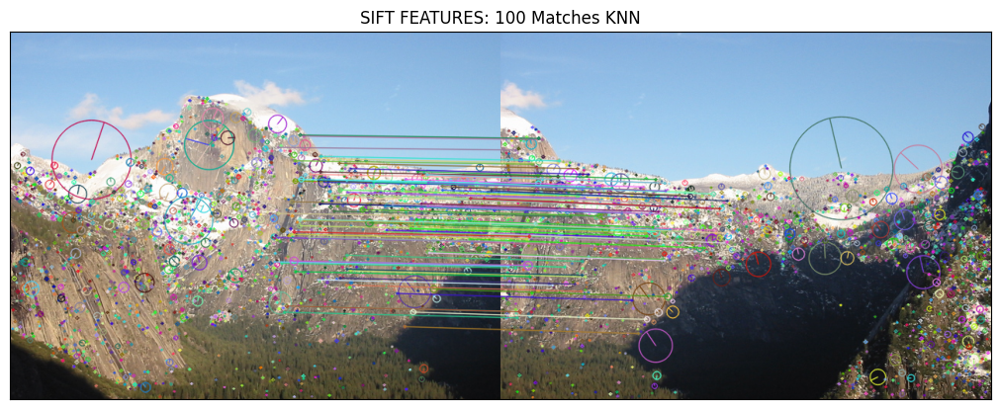

In [114]:
matches_knn = matching(ds1,ds2,'KNN')
showMatches(im1,kp1,im2,kp2,matches_knn, 100, 'SIFT FEATURES: 100 Matches KNN')

<font color='blue'>Now, we have to perform exactly the same operation, but employing Haralick features. To do so, we are going to create a small window ($7\times7$ pixels) centered around the SIFT keypoint detected, and we are going to use `mahotas` library to compute those texture-based descriptors.

In [115]:
!pip install mahotas

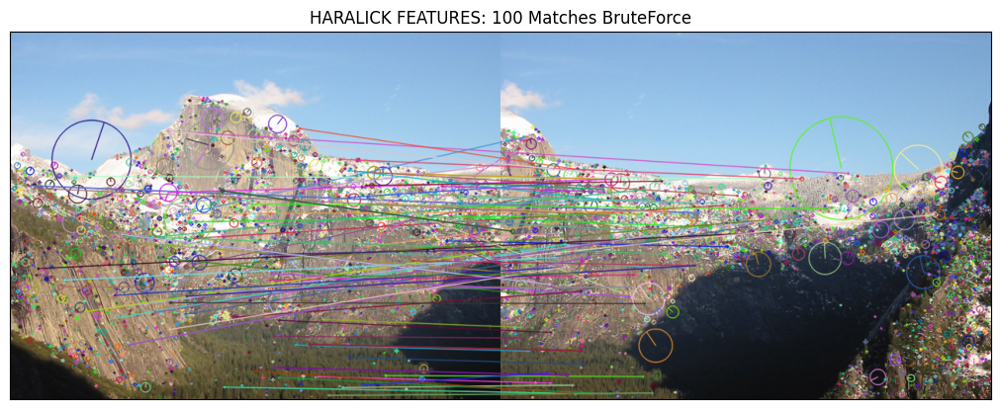

In [116]:
from mahotas.features import haralick
# Function to compute Haralick descriptors for a given keypoint and image
def computeHaralickDescriptors(im, kp, window_size=15):
    haralick_descriptors = []
    half_window = window_size // 2
    for point in kp:
        x, y = int(point.pt[0]), int(point.pt[1])
        # Crop the window around the keypoint
        x_start = max(0, x - half_window)
        x_end = min(im.shape[1], x + half_window)
        y_start = max(0, y - half_window)
        y_end = min(im.shape[0], y + half_window)
        window = im[y_start:y_end, x_start:x_end]
        try:
          features = haralick(window).mean(axis=0)
          haralick_descriptors.append(features)
        except:
          print('x,y', x, y)
          print('box', x_start,x_end, y_start,y_end)
          print('window',window)
    return np.array(haralick_descriptors)

# Extract keypoints from SIFT and descriptors from Haralick
kp1, _ = siftPoints(im1)
kp2, _ = siftPoints(im2)
ds_haralick1 = computeHaralickDescriptors(im1,kp1)
ds_haralick2 = computeHaralickDescriptors(im2,kp2)

# Change data type for matching
ds_haralick1 = ds_haralick1.astype('float32')
ds_haralick2 = ds_haralick2.astype('float32')

# Matching the two images
matches = matching(ds_haralick1,ds_haralick2,'BF')
showMatches(im1,kp1,im2,kp2,matches,100, 'HARALICK FEATURES: 100 Matches BruteForce')


<font color='blue'> Which feature descriptor seems to be more suitable for keypoint matching? Why?

Among these descriptors, SIFT is known for its robustness and accuracy, especially in scenarios with significant scale and rotation changes. SURF, on the other hand, is faster to compute than SIFT but offers comparable performance in many cases. ORB is a binary descriptor that combines speed and performance, making it suitable for real-time applications on resource-constrained devices.

In summary, while the Haralick algorithm can be used for texture analysis, for keypoint matching tasks, SIFT, SURF, or ORB descriptors are generally more suitable due to their robustness and performance in handling various image transformations and conditions.







# <font color='blue'>**Exercise 4:** Image Stitching using Homographies (3 points)

<font color='blue'>Now we are going to compute homographies between images, and use them to build a mosaic/panorama. To calculate the homography between two images, call the function `cv2.findHomography()`, which takes as input the lists of KeyPoints and the matches found between them. Use RANSAC to perform a robust estimation.

In [118]:
def homography(kp1, kp2, matches, Ransac_Error, MIN_MATCH_COUNT=20):
    # Check if enough matches are found
    if len(matches) > MIN_MATCH_COUNT:
        # Extract keypoints from matched points
        src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

        # Compute homography using RANSAC
        H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, Ransac_Error)
        return H
    else:
        print('Error - very few matches')
        return None



<font color='blue'>To compose the mosaic we need to provide the following information:

> <font color='blue'>a) Maximum size of the canvas according to the number of images to be stitched and their dimensions.

> <font color='blue'>b) The central image that will give the axes to the mosaic.

> <font color='blue'>c) The order of each image with respect to the central one (i.e., we know the position of each image in the burst of images taken).

> <font color='blue'>d) The homography to copy the central image into the canvas.

<font color='blue'>Now, once all the aforementioned decisions have been made, we need to proceed as follows:
> <font color='blue'>a) Read the images from left to right.

> <font color='blue'>b) Set one central image as the reference to create the panorama. This one will provide the axes to the canvas.

> <font color='blue'>c) Compute the homography between each two consecutive images in your list.

> <font color='blue'>d) Set the canvas and the reference homography.

> <font color='blue'>e) Compute the homography between each image and the canvas.

> <font color='blue'>f) Use the computed homographies to transport the images to the canvas. Use the function `cv2. warpPerspective()`.

> <font color='blue'>g) Remove the black regions from the canvas to improve quality.



In [121]:
# this function computes the homographies between each two consecutive images
def computeLocalHomographies(images, method='KNN', Ransac_Error=5.0):
    H = []
    if method == 'KNN':
        matcher = cv2.BFMatcher(cv2.NORM_L2)
    for i in range(len(images)-1):
        # Compute keypoints and descriptors for two consecutive images
        kp1, des1 = siftPoints(images[i])
        kp2, des2 = siftPoints(images[i+1])

        # Match keypoints between two consecutive images
        if method == 'KNN':
            matches = matcher.knnMatch(des1, des2, k=2)
            good_matches = []
            for m, n in matches:
                if m.distance < 0.75 * n.distance:
                    good_matches.append(m)
        else:
            # Implement other methods if needed
            pass

        # Compute homography using RANSAC
        H.append(homography(kp1, kp2, good_matches, Ransac_Error))
    return H


# this function computes the homography from each image to the canvas
def mosaicHomographies(H, idx):
    H_mosaic = [np.eye(3)] * len(H)
    for i in range(len(H)):
        if i < idx:
            for j in range(i, idx):
                H_mosaic[i] = np.dot(H[j], H_mosaic[i])
        elif i >= idx:
            for j in range(idx, i+1):
                H_mosaic[i] = np.dot(np.linalg.inv(H[j]), H_mosaic[i])
    return H_mosaic


# this function defines and return the canvas
def setCanvas(rows, cols, flagColor, nim=2):
    return np.zeros((rows, cols), np.uint8)


# this function fixes the homography from the central image to the canvas
def axesHomography(sizeim, sizecanvas):
    H = np.eye(3)
    H[0, 2] = sizecanvas[1] // 2 - sizeim[1] // 2
    H[1, 2] = sizecanvas[0] // 2 - sizeim[0] // 2
    return H

# This function removes the redundant pixels from the canvas
def blackOut(img, offset=0):
  if len(img.shape)==3:
    im =cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    mask = np.array((im > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset,:]
  else:
    mask = np.array((img > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset]

# This function composes the mosaic by applying the homographies to the images and overlaying them on the canvas
def composeMosaic(images, canvas, H, idxc, H0):
    rows = canvas.shape[0]
    cols = canvas.shape[1]

    # apply homography to images on the left side starting from the furthest left image and overlay it on the canvas
    for i in range(idx):
        H_total = np.dot(H0, H[i])
        canvas = cv2.warpPerspective(images[i], H_total, (cols, rows), canvas, borderMode=cv2.BORDER_TRANSPARENT)

    # apply homography to images on the right side starting from the furthest right image and overlay it on the canvas
    for i in range(len(H),5,-1):
        H_total = np.dot(H0, H[i-1])
        canvas = cv2.warpPerspective(images[i], H_total, (cols, rows), canvas, borderMode=cv2.BORDER_TRANSPARENT)

    # apply homography to central image at last and overlay it on the canvas
    canvas = cv2.warpPerspective(images[idxc], H0, (cols, rows), canvas, borderMode=cv2.BORDER_TRANSPARENT)
    return canvas


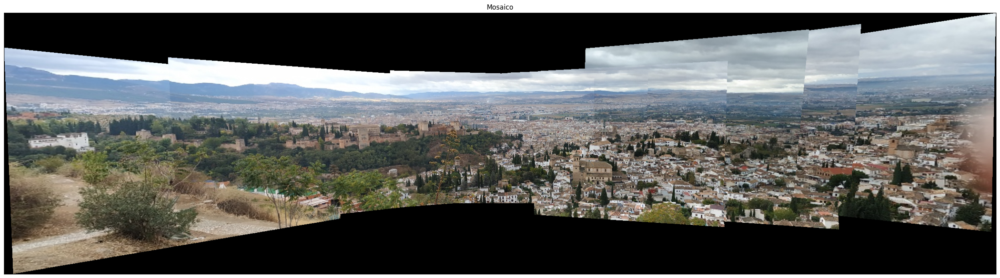

In [122]:
images=[]
# Mosaic construction: Left-Right camera motion
PREFIX = 'IMG_20211030_1104'
DIR = ''
nameImages = ['10_S.jpg', '13_S.jpg', '15_S.jpg', '17_S.jpg', '18_S.jpg', '20_S.jpg',
              '21_S.jpg', '25_S.jpg', '26_S.jpg', '28_S.jpg', '31_S.jpg', '33_S.jpg',
              '34_S.jpg', '36_S.jpg']

for item in nameImages:
    images.append(readIm(get_image(PREFIX+item), flagColor=1))

# To be completed by the students
H = computeLocalHomographies(images)
H = mosaicHomographies(H, idx=5)  # Assuming the 5th image is the central one
canvas = setCanvas(4000, 6000, flagColor=1)  # Set the canvas size
H0 = axesHomography(images[5].shape, canvas.shape)  # Assuming the 5th image is the central one
mosaic = composeMosaic(images, canvas, H, idxc=5, H0=H0)
displayIm(blackOut(mosaic),'Mosaico',5)

